In [1]:
import os,sys
import numpy as np
from imageio.v2 import imread
from PIL import Image
import scipy
from scipy.signal import convolve2d
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage import color
import matplotlib.pyplot as plt

In [2]:
"""
• 'L' (8-bit pixels, grayscale)
• 'P' (8-bit pixels, mapped to any other mode using a color palette)
• 'RGB' (3x8-bit pixels, true color)
• 'RGBA' (4x8-bit pixels, true color with transparency mask)
• 'CMYK' (4x8-bit pixels, color separation)
• 'YCbCr' (3x8-bit pixels, color video format)
• 'I' (32-bit signed integer pixels)
• 'F' (32-bit floating point pixels)
"""

def access():
    PathImg = "./imagens/"
    lstFilesImg = []
    for dirName, subdirList, fileList in os.walk(PathImg):
        for filename in fileList:
            lstFilesImg.append(os.path.join(dirName,filename))

    print("Lista de imagens: ")
    print(lstFilesImg)

    img=imread(lstFilesImg[0],pilmode='RGB')
    print("Dimensões 1ª imagem: ", img.shape)

    width=512
    height=512
    aspect_ratio = 1

    imglist=[]
    for file in lstFilesImg:
        img=imread(file,pilmode='RGB')
        img=np.array(Image.fromarray(img).resize((width,int(height* aspect_ratio))))
        imglist.append(img)
    Imagens = np.asarray(imglist,dtype=np.uint8)
    print("Após resize: ", Imagens.shape)
    return Imagens

Imagens = access()

Lista de imagens: 
['./imagens/8.0001.jpg', './imagens/histologica.jpg', './imagens/ISIC_0013411.jpg', './imagens/pe_diabetico005.jpg']
Dimensões 1ª imagem:  (881, 1081, 3)
Após resize:  (4, 512, 512, 3)


A usar kernel identidade...
(512, 512)


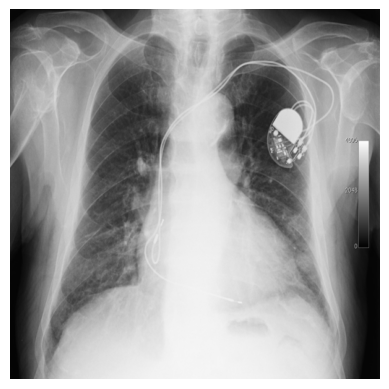

(512, 512)


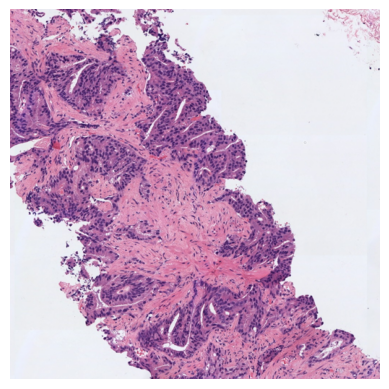

(512, 512)


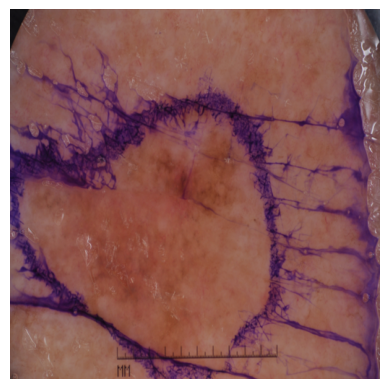

(512, 512)


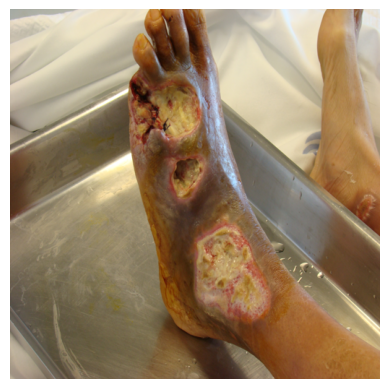

In [3]:
def identity(Imagens):
    print("A usar kernel identidade...")
    kernel = np.array([
        [0,0,0],
        [0,1,0],
        [0,0,0]
    ])

    for i in range(len(Imagens)):
        print(Imagens[i,:,:,0].shape)
        temp_r = convolve2d(Imagens[i,:,:,0],kernel,mode='same')
        temp_g = convolve2d(Imagens[i,:,:,1],kernel,mode='same')
        temp_b = convolve2d(Imagens[i,:,:,2],kernel,mode='same')
        img = np.dstack((temp_r, temp_g, temp_b))
        
        plt.axis('off')
        plt.imshow(img,cmap='gray')
        plt.show()

identity(Imagens)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


A usar Vertical Edge Detection...


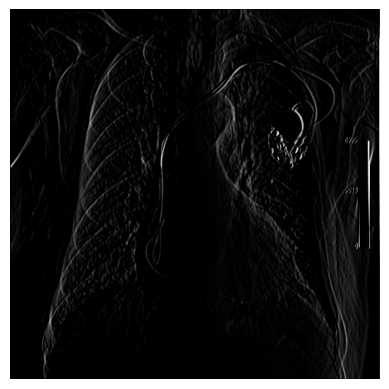

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


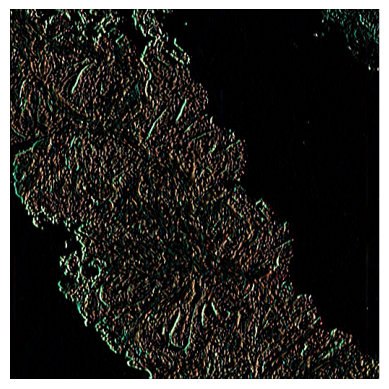

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


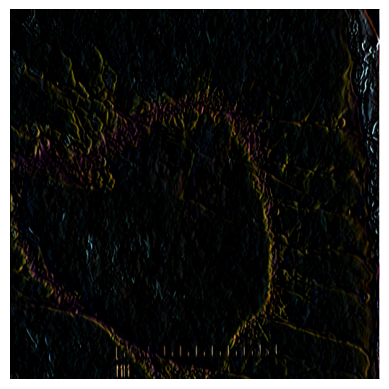

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


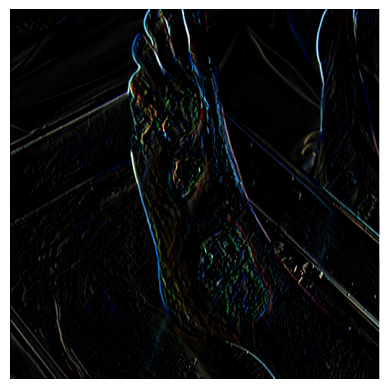

In [4]:
def VED(Imagens):
    print("A usar Vertical Edge Detection...")
    kernel = np.array([
        [-1,0,1],
        [-1,0,1],
        [-1,0,1]
    ])

    for x in range(len(Imagens)):
        temp_r = convolve2d(Imagens[x,:,:,0],kernel,mode='same')
        temp_g = convolve2d(Imagens[x,:,:,1],kernel,mode='same')
        temp_b = convolve2d(Imagens[x,:,:,2],kernel,mode='same')
        img = np.dstack((temp_r, temp_g, temp_b))
        
        plt.axis('off')
        plt.imshow(img,cmap='gray')
        plt.show()

VED(Imagens)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


A usar Horizontal Edge Detection...


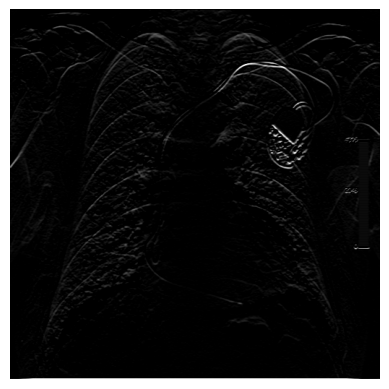

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


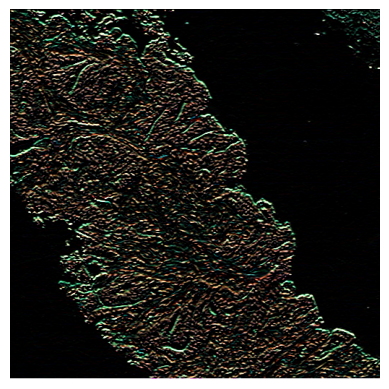

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


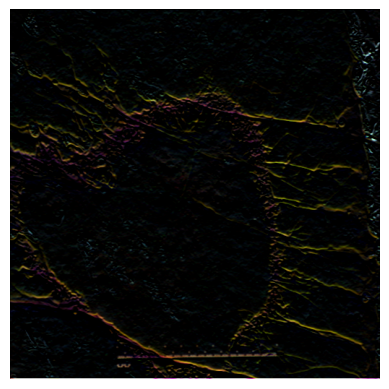

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


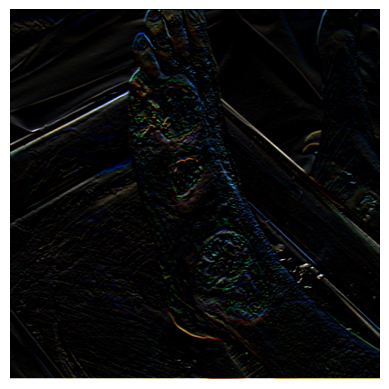

In [5]:
def HED(Imagens):
    print("A usar Horizontal Edge Detection...")
    kernel = np.array([
        [-1,-1,-1],
        [0,0,0],
        [1,1,1]
    ])

    for x in range(len(Imagens)):
        temp_r = convolve2d(Imagens[x,:,:,0],kernel,mode='same')
        temp_g = convolve2d(Imagens[x,:,:,1],kernel,mode='same')
        temp_b = convolve2d(Imagens[x,:,:,2],kernel,mode='same')
        img = np.dstack((temp_r, temp_g, temp_b))
        
        plt.axis('off')
        plt.imshow(img,cmap='gray')
        plt.show()

HED(Imagens)

A usar Gradient Magnitude Edge Detection...


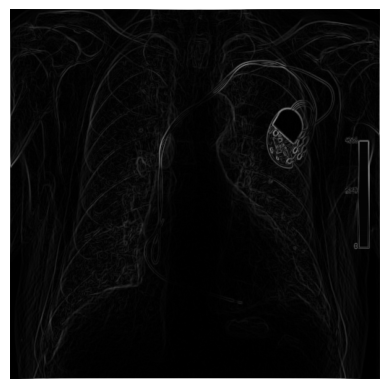

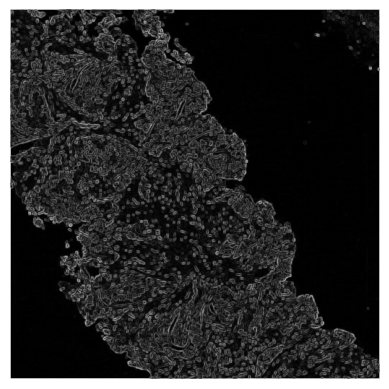

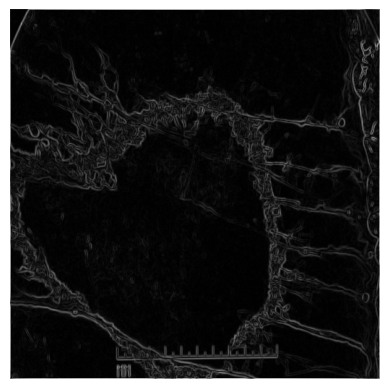

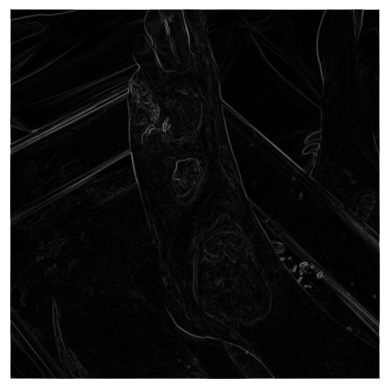

In [6]:
def GMED(Imagens):
    print("A usar Gradient Magnitude Edge Detection...")
    kernel1 = np.array([
        [-1,-1,-1],
        [0,0,0],
        [1,1,1]
    ])
    kernel2 = np.array([
        [-1,0,1],
        [-1,0,1],
        [-1,0,1]
    ])

    for x in range(len(Imagens)):
        temp1 = convolve2d(Imagens[x,:,:,0],kernel1,mode='same')
        temp2 = convolve2d(Imagens[x,:,:,0],kernel2,mode='same')
        temp3 = np.sqrt(temp1**2 + temp2**2)
        #raiz quadrada de temp1^2 + temp2^2

        plt.axis('off')
        plt.imshow(temp3,cmap='gray')
        plt.show()

GMED(Imagens)

A usar Gradient Direction Edge Detection...


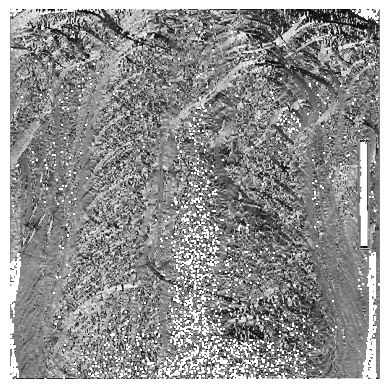

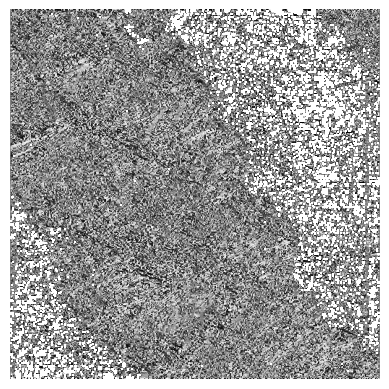

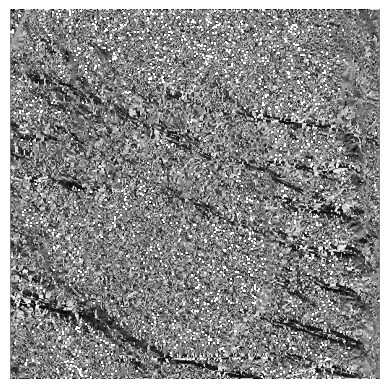

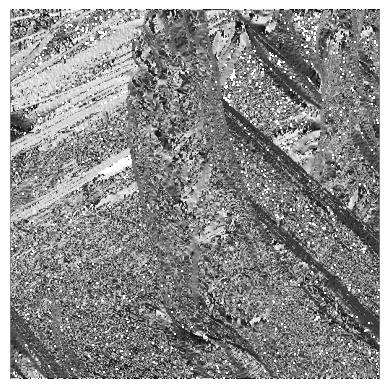

In [7]:
np.seterr(divide='ignore', invalid='ignore')

def GDED(Imagens):
    print("A usar Gradient Direction Edge Detection...")
    kernel1 = np.array([
        [-1,-1,-1],
        [0,0,0],
        [1,1,1]
    ])
    kernel2 = np.array([
        [-1,0,1],
        [-1,0,1],
        [-1,0,1]
    ])

    for x in range(len(Imagens)):
        temp1 = convolve2d(Imagens[x,:,:,0],kernel1,mode='same')
        temp2 = convolve2d(Imagens[x,:,:,0],kernel2,mode='same')
        temp3 = np.arctan(temp1/temp2)
        #arctang(temp1/temp2)
        
        plt.axis('off')
        plt.imshow(temp3,cmap='gray')
        plt.show()

GDED(Imagens)

A usar Sobel Filters - Gradient Magnitude...


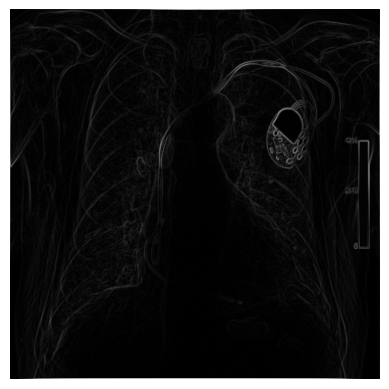

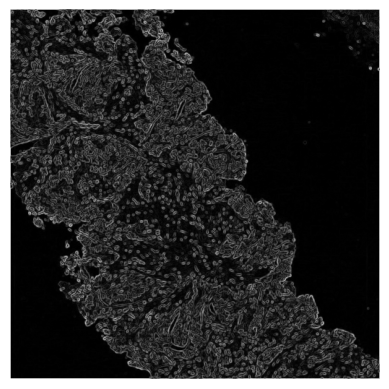

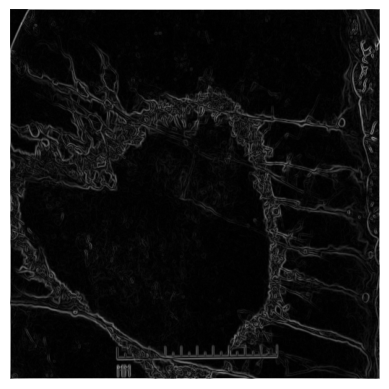

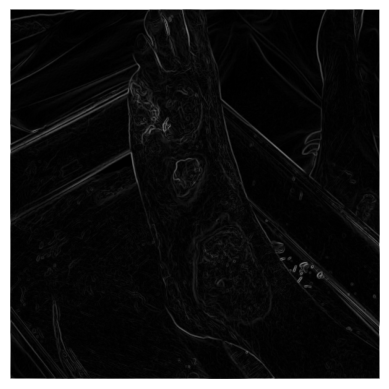

In [8]:
def SFgm(Imagens):
    print("A usar Sobel Filters - Gradient Magnitude...")
    kernel1 = np.array([
        [1,2,1],
        [0,0,0],
        [-1,-2,-1]
    ])
    kernel2 = np.array([
        [1,0,-1],
        [2,0,-2],
        [1,0,-1]
    ])

    for x in range(len(Imagens)):
        temp1 = convolve2d(Imagens[x,:,:,0],kernel1,mode='same')
        temp2 = convolve2d(Imagens[x,:,:,0],kernel2,mode='same')
        temp3 = np.sqrt(temp1**2 + temp2**2)
        #raiz quadrada de temp1^2 + temp2^2

        plt.axis('off')
        plt.imshow(temp3,cmap='gray')
        plt.show()

SFgm(Imagens)

A usar Sobel Filters - Gradient Direction...


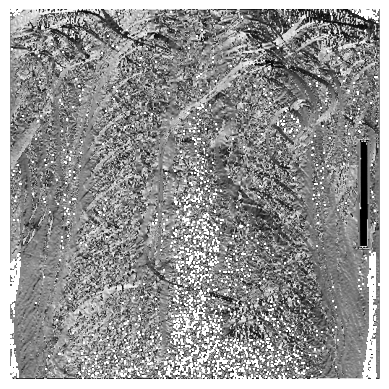

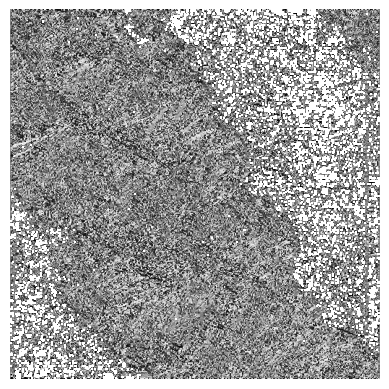

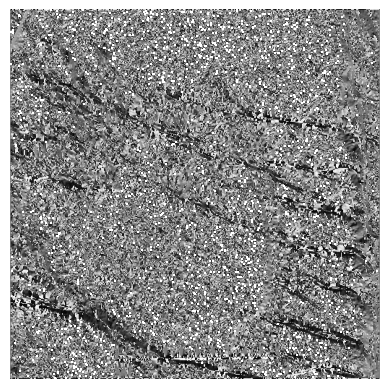

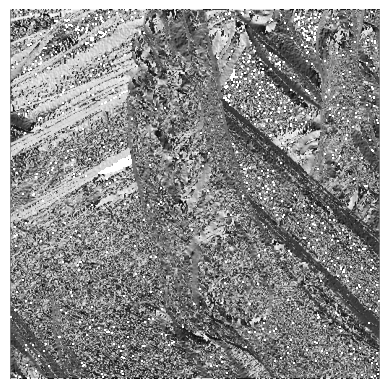

In [9]:
np.seterr(divide='ignore', invalid='ignore')

def SFgd(Imagens):
    print("A usar Sobel Filters - Gradient Direction...")
    kernel1 = np.array([
        [1,2,1],
        [0,0,0],
        [-1,-2,-1]
    ])
    kernel2 = np.array([
        [1,0,-1],
        [2,0,-2],
        [1,0,-1]
    ])

    for x in range(len(Imagens)):
        temp1 = convolve2d(Imagens[x,:,:,0],kernel1,mode='same')
        temp2 = convolve2d(Imagens[x,:,:,0],kernel2,mode='same')
        temp3 = np.arctan(temp1/temp2)
        #arctang(temp1/temp2)

        plt.axis('off')
        plt.imshow(temp3,cmap='gray')
        plt.show()

SFgd(Imagens)

A usar Gaussian Blur...


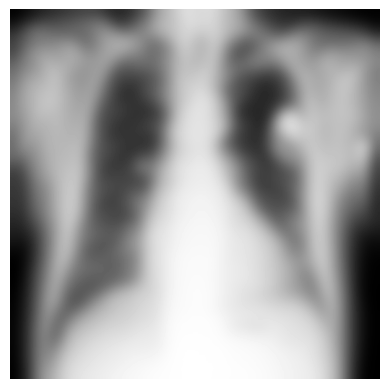

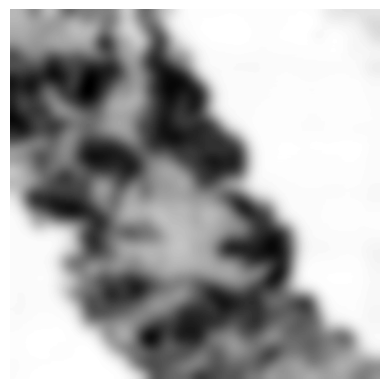

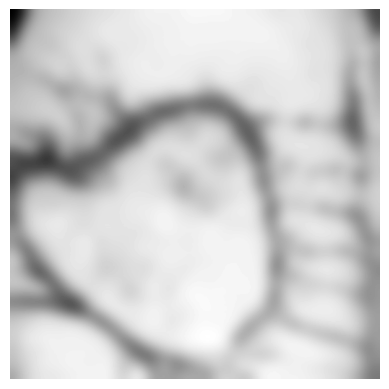

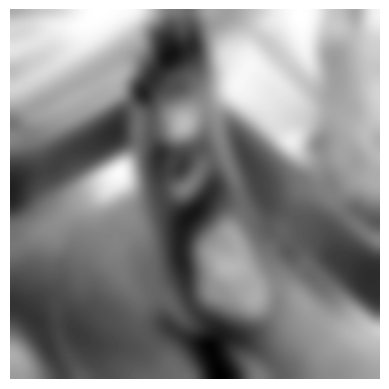

In [10]:
def GB(Imagens):
    print("A usar Gaussian Blur...")
    for x in range(len(Imagens)):
        temp = scipy.ndimage.gaussian_filter(Imagens[x,:,:,0],sigma = 10 ) #filtro gaussiano
        
        plt.axis('off')
        plt.imshow(temp,cmap='gray')
        plt.show()

GB(Imagens)

A usar Edge Sharpening...


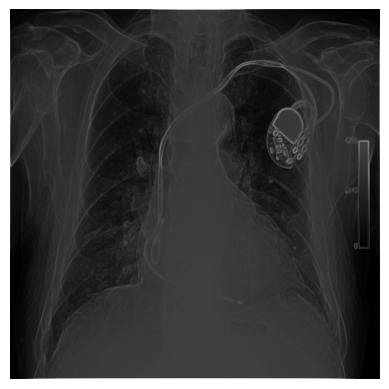

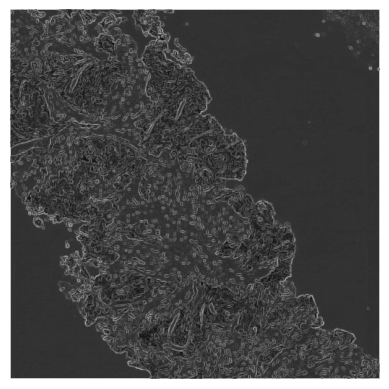

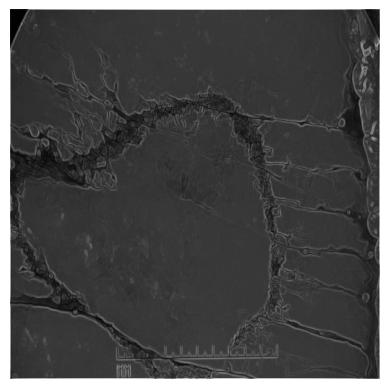

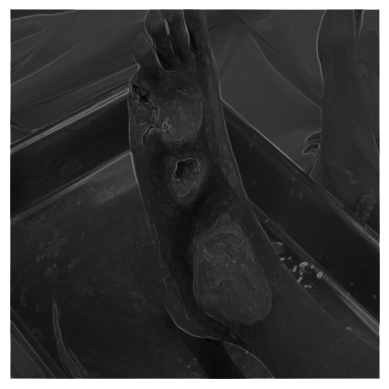

In [11]:
def sharp(Imagens):
    print("A usar Edge Sharpening...")
    kernel1 = np.array([
        [1,1,1],
        [0,0,0],
        [-1,-1,-1]
    ])
    kernel2 = np.array([
        [1,0,-1],
        [1,0,-1],
        [1,0,-1]
    ])

    for x in range(len(Imagens)):
        temp1 = convolve2d(Imagens[x,:,:,0],kernel1,mode='same')
        temp2 = convolve2d(Imagens[x,:,:,0],kernel2,mode='same')
        temp3 = np.sqrt(temp1**2 + temp2**2)
        #raiz quadrada de temp1^2 + temp2^2

        plt.axis('off')
        plt.imshow(temp3 +Imagens[x,:,:,0] ,cmap='gray')
        plt.show()

sharp(Imagens)

A usar Emboss...


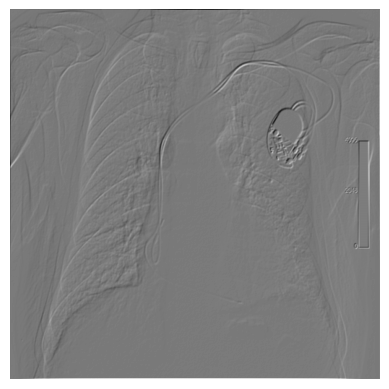

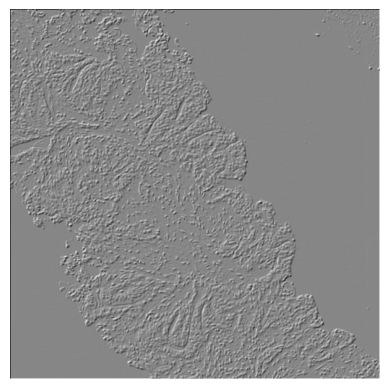

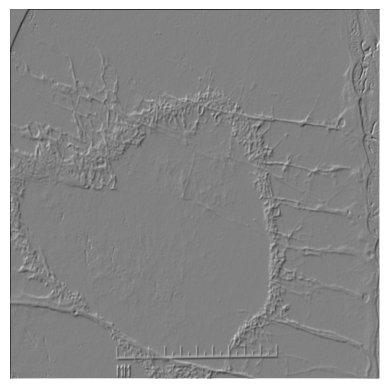

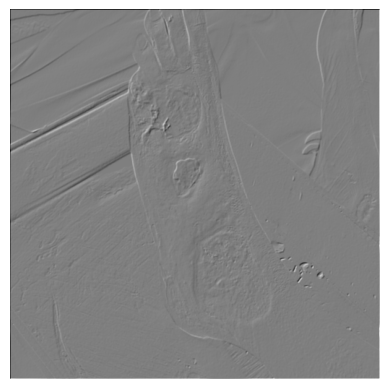

In [12]:
def emboss(Imagens):
    print("A usar Emboss...")
    kernel = np.array([
        [-1,-1,0],
        [-1,0,1],
        [0,1,1]
    ])

    for x in range(len(Imagens)):
        temp = convolve2d(Imagens[x,:,:,0],kernel,mode='same') + 128
        
        plt.axis('off')
        plt.imshow(temp,cmap='gray')
        plt.show()

emboss(Imagens)

A usar Superpixel...


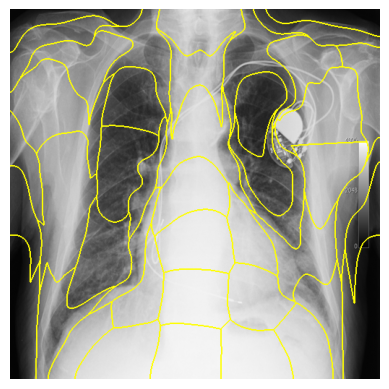

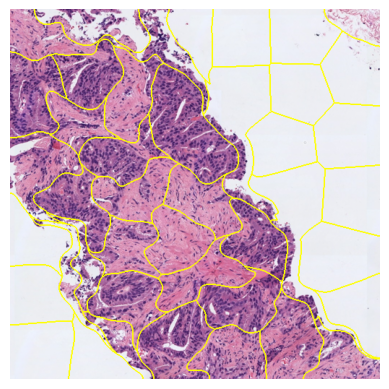

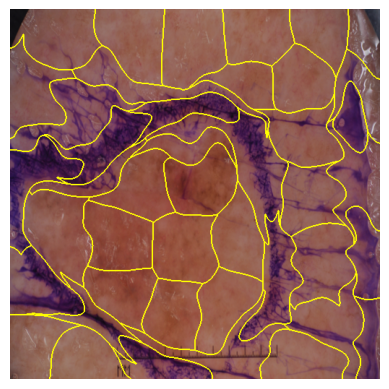

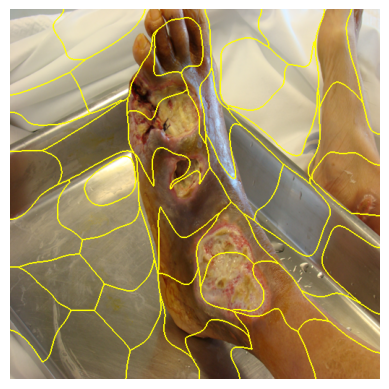

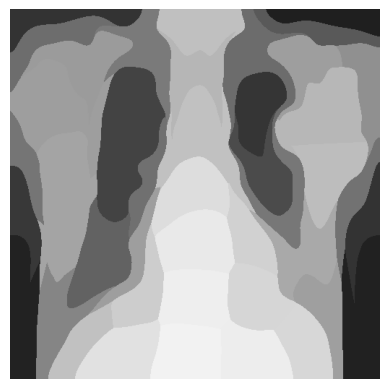

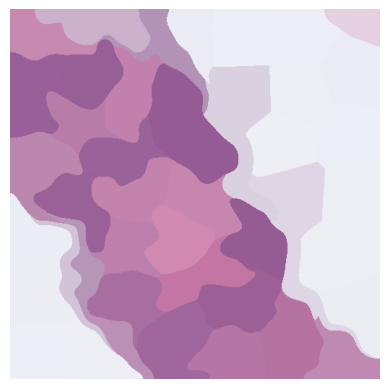

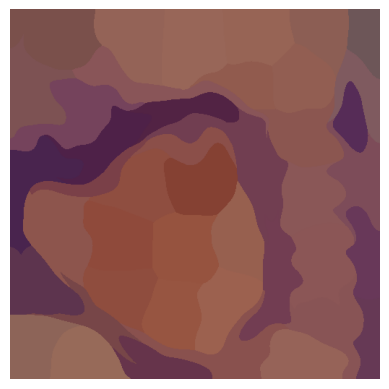

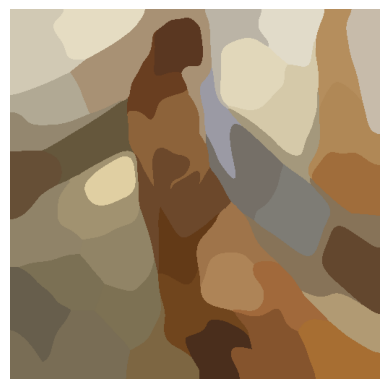

In [13]:
def SP(Imagens):
    print("A usar Superpixel...")
    for x in range(len(Imagens)):
        segments = slic(Imagens[x,:,:], n_segments = 50, sigma = 10)
        
        plt.axis('off')
        plt.imshow(mark_boundaries(Imagens[x,:,:], segments))
        plt.show()

    for x in range(len(Imagens)):
        segments = slic(Imagens[x,:,:], n_segments = 50, sigma = 10)
        out1 = color.label2rgb(segments, Imagens[x,:,:], kind='avg')

        plt.axis('off')
        plt.imshow(out1)
        plt.show()

SP(Imagens)